Goal: get the best fit acheiveable with just a 2 + 1 dimension linear regression
General strategy: use categorical features to reduce dimensionality and create groups or nodes that share the most in common, then fit a 2d multiple linear regression on these groupings generating an N number of 3d regression fit plots 

General strategy: 

PCA to reduce dimensionality of categorical values ==> kMeans classifier to assign observations into groups ==> MLR to fit 2 numerical dimensions(probably feature engineered) 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import missingno as mn #missingno had to be installed 'pip install missingno' 
import math
import matplotlib.pyplot as plt
%matplotlib inline 


# Loading Data, Str/Int Split

In [2]:
train = pd.read_csv('train.csv')

In [3]:
intCols = train.columns[(train.dtypes == 'int64')| (train.dtypes == 'float64')]
strCols = train.columns[train.dtypes == 'object']

In [4]:
dfInt = train[intCols]
dfStr = train[strCols]
print(dfInt.shape, dfStr.shape)

(1460, 38) (1460, 43)


In [5]:
dfStr.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [6]:
# setting up the y target variable (log10(SalePrice))
target = dfInt.SalePrice.apply(math.log10)
# drop SalePrice from dfInt
dfInt = dfInt.drop(['SalePrice','Id'], axis = 1)
target.shape

(1460,)

In [8]:
target = pd.DataFrame(target)
#target

# Categorical transform 

In [9]:
#using Class shared on the git repo 
class NumericDataFrame():
    """
    This class converts categorical types of a dataframe into numeric types.
    It also automatically imputes missing values as the row mean.
    """
    def __init__(self, df):
        self.type_objs = df.select_dtypes(exclude=['float64',"int64"])
        self.type_numeric = df.select_dtypes(include=['float64',"int64"])
        self.transform_dict = self.get_transform_dict()
        
    def impute(self, df):
        df = df.apply(lambda x: x.fillna(1),axis=0)
        return df

    def get_transform_dict(self):
        transform_dict = {}
        for col in self.type_objs.columns:
            cats = pd.Categorical(self.type_objs[col]).categories
            d = {}
            for i, cat in enumerate(cats):
                d[cat] = i + 2
            transform_dict[col] = d
        return transform_dict

    def __call__(self):
        df = self.type_objs
        df.replace(self.transform_dict, inplace=True)
        df = pd.merge(self.type_numeric, df, left_index=True, right_index=True)
        df = self.impute(df)
        return df

In [430]:
CatNum = NumericDataFrame(dfStr)()
#normalized version
CatNumNorm=(CatNum-CatNum.min())/(CatNum.max()-CatNum.min())
#CatNumNorm

def norm(df):
    return(df - df.min())/(df.max() - df.min())

In [11]:
# impute missingness in dfInt
from sklearn.preprocessing import Imputer

fill_NaN = Imputer(missing_values=np.nan, strategy='mean', axis=1)
dfInt = pd.DataFrame(fill_NaN.fit_transform(dfInt))

CatNumNorm.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

# PCA experiments

In [325]:
from sklearn import decomposition
from mpl_toolkits.mplot3d import Axes3D


pca_2d = decomposition.PCA(n_components = 2)
pca = decomposition.PCA(n_components=3)
pca.fit(CatNumNorm)
X = pca.transform(CatNumNorm)
CatNumNorm.columns
pca.n_components

3

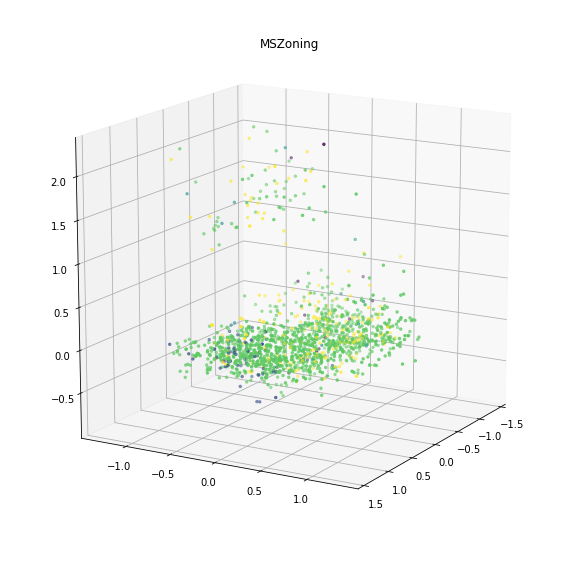

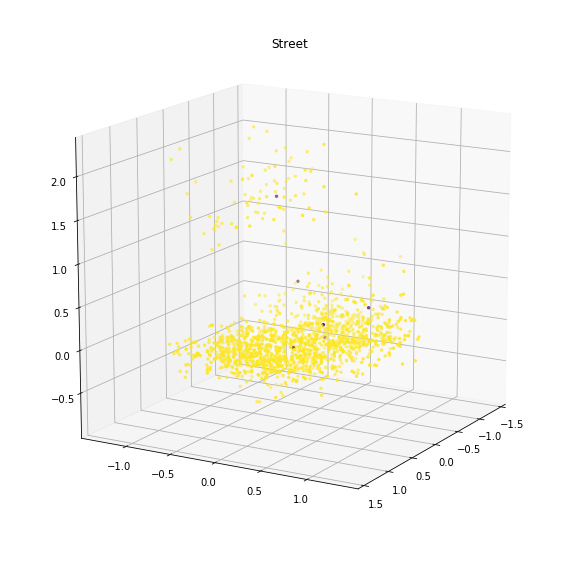

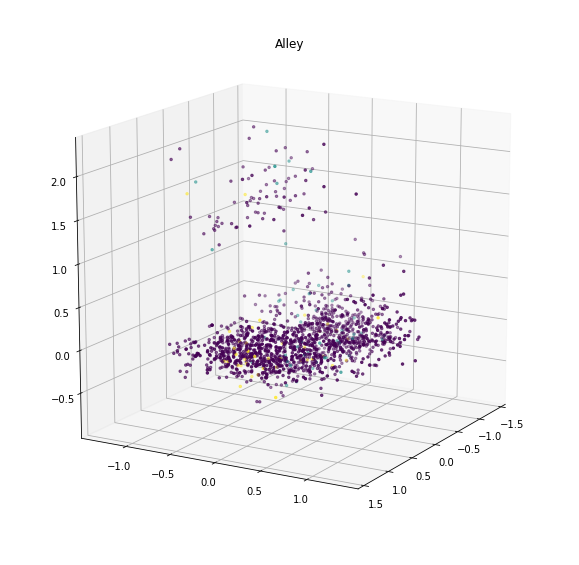

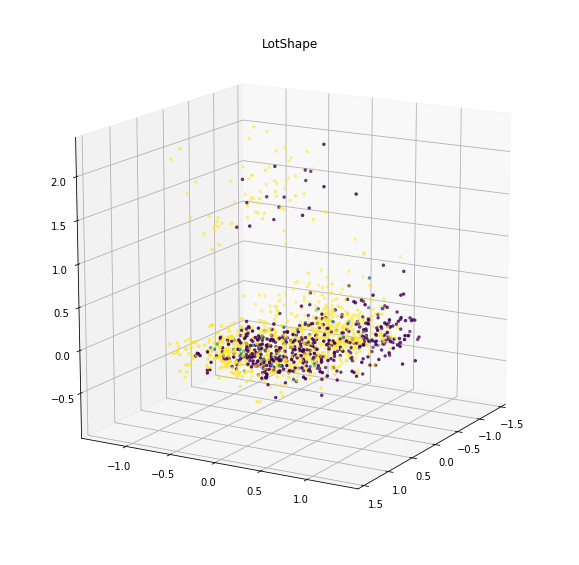

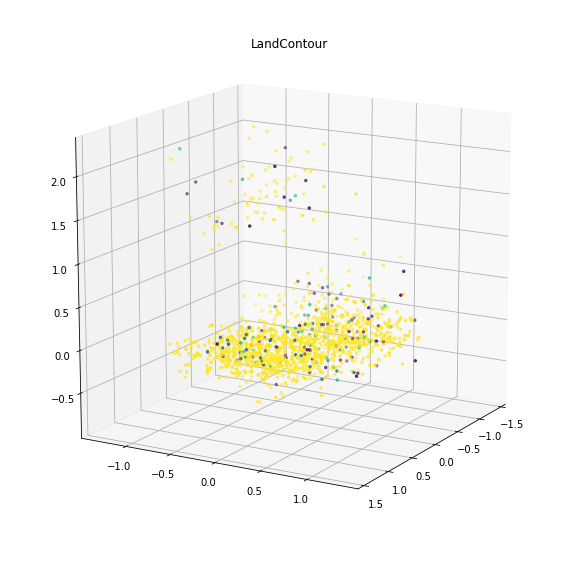

...

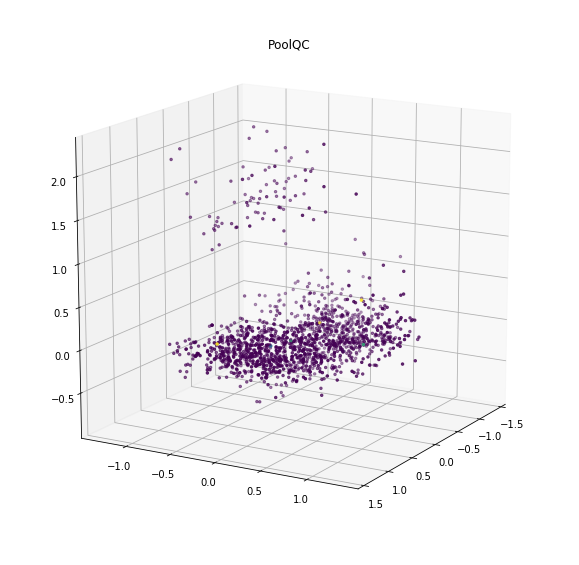

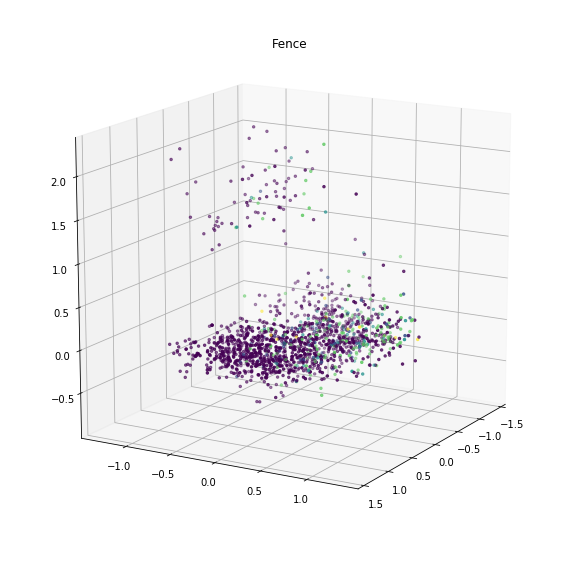

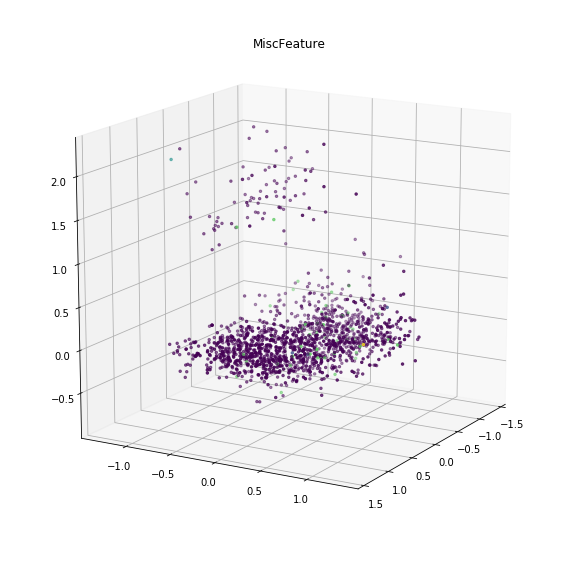

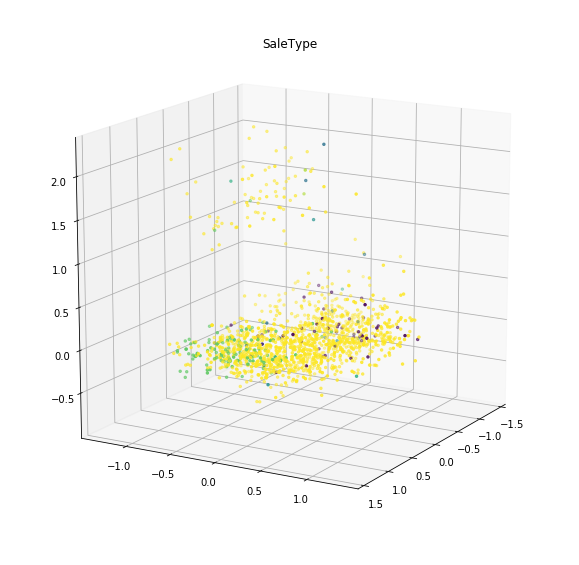

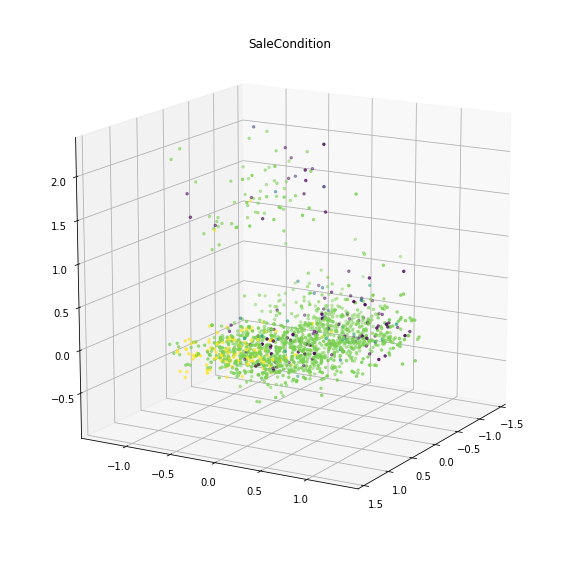

In [306]:


for each in CatNumNorm.columns:
    fig = plt.figure(figsize = [10,10])
    color = CatNumNorm[each]
    

    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(X[:,0], X[:,1], X[:,2], c=color, s=6)
    plt.viridis()
    plt.title(each)

    ax.view_init(15, 30) # change these params to rotate cube
    plt.show()


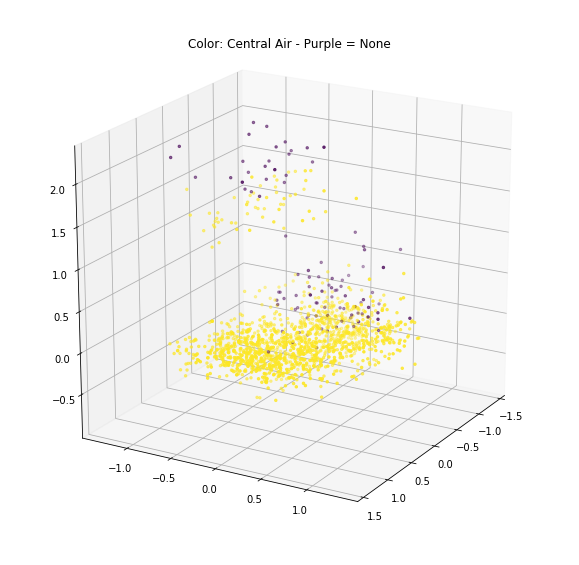

In [251]:
fig = plt.figure(figsize = [10,10])
color = CatNumNorm.CentralAir
    

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:,0], X[:,1], X[:,2], c=color, s=6)
plt.viridis()
plt.title("Color: Central Air - Purple = None")


ax.view_init(20, 30) # change these params to rotate cube
plt.show()

array([ 0.13924304,  0.09481077,  0.07864358,  0.06827748,  0.0627666 ,
        0.05433367,  0.04633688,  0.03927749,  0.033437  ,  0.03202466,
        0.02928686,  0.0255943 ,  0.02342274,  0.02257379,  0.02166815,
        0.02002328,  0.01733779,  0.01710398,  0.01564015,  0.01403145,
        0.01384703,  0.01221607,  0.01207279,  0.01158276,  0.01052343,
        0.01010911,  0.00948765,  0.00828035,  0.00812986,  0.00778145,
        0.00710536,  0.00660489,  0.00554524,  0.00449308,  0.00422015,
        0.00300525,  0.00263652,  0.00219936,  0.00140544,  0.0010871 ,
        0.00105249,  0.00052166,  0.00025932])

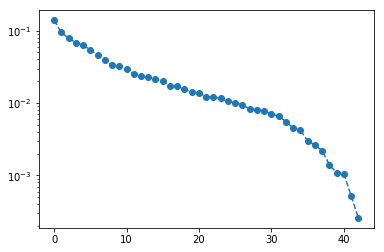

In [405]:

pca_trafo = decomposition.PCA().fit(CatNumNorm)

plt.semilogy(pca_trafo.explained_variance_ratio_, '--o')

pca_trafo.explained_variance_ratio_

In [223]:
X.shape

(1460, 3)

# trying ANOVA to prune features instead (not used)

In [23]:
#from sklearn import feature_selection


#anova = feature_selection.SelectPercentile(feature_selection.f_regression)
#select = anova.fit(CatNum, target)
#SelectPercentile

In [24]:
#ANOVAscores = pd.DataFrame(list(zip(CatNum.columns, select.scores_, select.pvalues_)),\
                        #columns = ['feature', 'score', 'p_value'])
#ANOVAscores.sort_values('score', ascending = False)

In [25]:
#FeatCut = list(ANOVAscores.feature.iloc[0:3])

In [26]:
#CutCatNorm = CatNumNorm[FeatCut]

# feed PCA space into kmeans classifier

In [392]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 2)
kmeans.fit(X)
labels = kmeans.labels_
kmeans.score(X)
set(labels)

{0, 1}

In [304]:
# try different clustering algorithms 

from sklearn.cluster import AgglomerativeClustering

AGroup = AgglomerativeClustering(n_clusters = 2, linkage = 'average')
AGroup.fit(X)
Clusters = AGroup.labels_

# Agglomerative Clustering gives results that make more sense 

# Color the observation in PCA space by group

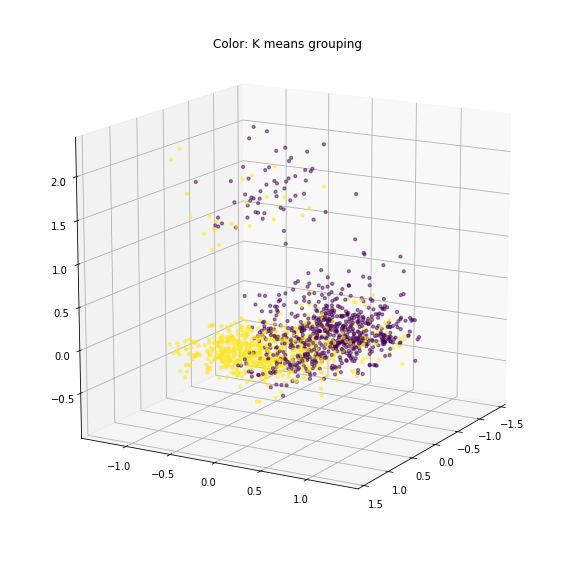

In [393]:
fig = plt.figure(figsize = [10,10])
color = labels
    

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:,0], X[:,1], X[:,2], c=color, s=10, alpha = 0.5)
plt.viridis()
plt.title("Color: K means grouping ")


ax.view_init(15, 30) # change these params to rotate cube
plt.show()



In [29]:
target.shape

(1460, 1)

In [30]:
# playing with a 2 layer classifier passing through a k-means classifier into groups
# observations are labeled by group and passed into a lin regression by group
# this does nothing to improve score, K-means probably not doing anything meaningful

from sklearn.linear_model import LinearRegression

def twoLayer(n_nodes, dataCat, dataNum, tar):
    #firstlayer: k-means classifier groups into different nodes 
    #dummies = pd.get_dummies(dataCat)
    kmeans = KMeans(n_clusters = n_nodes, random_state = 10)
    kmeans.fit(dataCat)
    labels = kmeans.labels_
    #connection: modifying numeric dataframe with new groups
    
    dataNum['group'] = labels
    tar['group'] = labels
    #set up Lin regressor 
    lin = LinearRegression()
    # doing lasso and giving score for each group
    for n in range(0, n_nodes):
        X = dataNum[dataNum['group'] == n]
        y = tar[tar['group'] == n]
        X = X.iloc[:,-1]
        y = y.iloc[:,0]
        lin.fit(X,y)
        print(lin.score(X,y))

In [35]:
#twoLayer(1, CutCatNorm, dfInt, target)

In [36]:
#dfInt.columns = intCols # column names lost during imputation. replacing

intColsdroped = intCols.drop(['Id', 'SalePrice'])
dfInt.columns = intColsdroped

# looking at 2 parameter MLR 

In [42]:
#first get score for every possible combination of continuous features

import itertools

columns = dfInt.columns

combos = list(itertools.product(columns, columns))

combos = [list(combo) for combo in combos] 

combos



[['MSSubClass', 'MSSubClass'],
 ['MSSubClass', 'LotFrontage'],
 ['MSSubClass', 'LotArea'],
 ['MSSubClass', 'OverallQual'],
 ['MSSubClass', 'OverallCond'],
 ['MSSubClass', 'YearBuilt'],
 ['MSSubClass', 'YearRemodAdd'],
 ['MSSubClass', 'MasVnrArea'],
 ['MSSubClass', 'BsmtFinSF1'],
 ['MSSubClass', 'BsmtFinSF2'],
 ['MSSubClass', 'BsmtUnfSF'],
 ['MSSubClass', 'TotalBsmtSF'],
 ['MSSubClass', '1stFlrSF'],
 ['MSSubClass', '2ndFlrSF'],
 ['MSSubClass', 'LowQualFinSF'],
 ['MSSubClass', 'GrLivArea'],
 ['MSSubClass', 'BsmtFullBath'],
 ['MSSubClass', 'BsmtHalfBath'],
 ['MSSubClass', 'FullBath'],
 ['MSSubClass', 'HalfBath'],
 ['MSSubClass', 'BedroomAbvGr'],
 ['MSSubClass', 'KitchenAbvGr'],
 ['MSSubClass', 'TotRmsAbvGrd'],
 ['MSSubClass', 'Fireplaces'],
 ['MSSubClass', 'GarageYrBlt'],
 ['MSSubClass', 'GarageCars'],
 ['MSSubClass', 'GarageArea'],
 ['MSSubClass', 'WoodDeckSF'],
 ['MSSubClass', 'OpenPorchSF'],
 ['MSSubClass', 'EnclosedPorch'],
 ['MSSubClass', '3SsnPorch'],
 ['MSSubClass', 'ScreenPorch'],

In [43]:
# plug each into a linear regressor
from sklearn.linear_model import LinearRegression


In [418]:
lin = LinearRegression()


In [45]:
scores = []
for combo in combos:
    scores.append(lin.fit(dfInt[combo], target).score(dfInt[combo], target))

In [46]:
markers = [(combo[0] + ' : ' + combo[1]) for combo in combos]
#markers


In [47]:
scores = pd.DataFrame(scores)

In [48]:
scores['combo'] = markers
scores.columns = ['score', 'combo']
#scores.sort_values('score', ascending = False)

In [49]:
cutscore = scores.sort_values('score', ascending = False).iloc[list(range(0, len(scores), 2))]
cutscore[:20]

,score,combo
543,0.739973,GrLivArea : OverallQual
903,0.724129,GarageCars : OverallQual
435,0.723646,1stFlrSF : OverallQual
939,0.721457,GarageArea : OverallQual
399,0.709726,TotalBsmtSF : OverallQual
130,0.709719,OverallQual : TotRmsAbvGrd
291,0.700718,BsmtFinSF1 : OverallQual
131,0.700188,OverallQual : Fireplaces
195,0.699420,YearBuilt : GrLivArea
126,0.697891,OverallQual : FullBath


# feature engineering to reduce continuous variables

In [415]:
 #Quality, and area are the biggest predictors. We can aggregate sqfootage as before and give lin sqft, include garage area

#maybe we can add overallQuallity + number of + cars + fireplaces 

totalSF = dfInt['1stFlrSF'] + dfInt['2ndFlrSF'] + dfInt['TotalBsmtSF'] + dfInt['GarageArea']
totalLF = totalSF.apply(math.sqrt)
fancy = dfInt['OverallQual'] + dfInt['GarageCars'] + dfInt['Fireplaces'] + dfInt['FullBath'] + dfInt['HalfBath']
#cutscore

In [416]:
CutIntLF = pd.DataFrame(list(zip(totalLF, fancy)), columns = ['totalLinFt', 'fanciness'])
CutIntSF = pd.DataFrame(list(zip(totalSF, fancy)), columns = ['totalLinFt', 'fanciness'])

In [420]:
#let's check score for this engineered data set
# 4-5% improvement. this is our baseline 

print(lin.fit(CutIntLF, target.SalePrice).score(CutIntLF, target.SalePrice))
lin.intercept_
intercept = lin.intercept_[0]
betas = lin.coef_[0]
totalLF.values


0.811957784717


IndexError: invalid index to scalar variable.

0.8119577847169106

# 3d model plot 

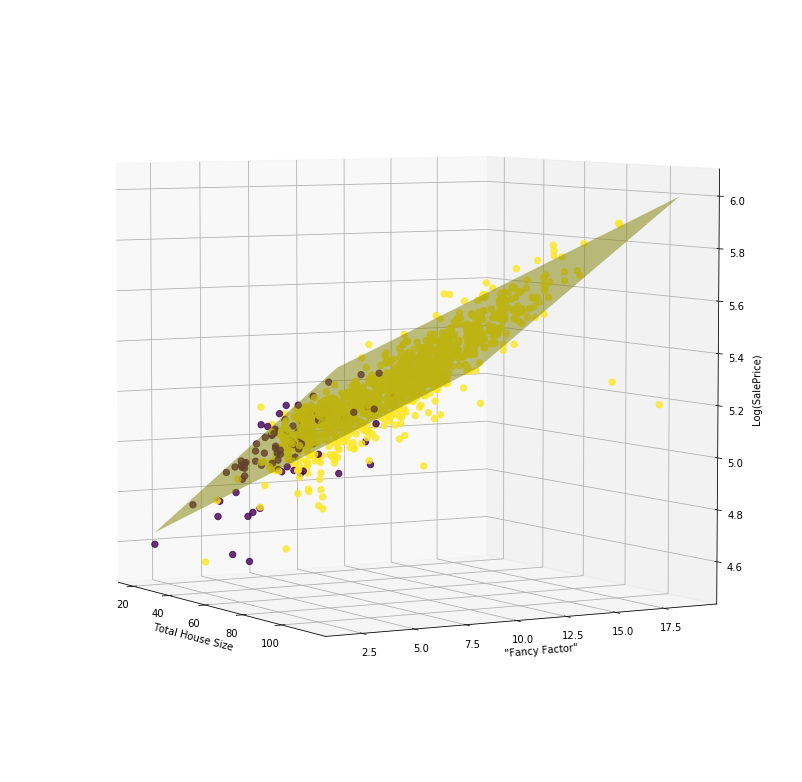

In [376]:
fig = plt.figure(figsize=(14, 14))
ax = plt.axes(projection='3d')

# plot the data points

ax.scatter(totalLF, fancy, target.SalePrice, c=  Clusters, alpha=.8, s = 40)
ax.view_init(5, 330)
#27, 0 to see fancy
# -20, 270 to look down property size plane
# 5, 330 for nice overview

# plot the plane which represents the true model
x_1 = np.linspace(min(totalLF), max(totalLF), 25)
x_2 = np.linspace(min(fancy), max(fancy), 25)
x_1, x_2 = np.meshgrid(x_1, x_2)
x_3 = betas[0]*x_1 + betas[1]*x_2 + intercept
surface_kwargs = dict(rstride=100, cstride=100, color='yellow', alpha=0.5)
ax.plot_surface(x_1, x_2, x_3, **surface_kwargs)
ax.set_xlabel('Total House Size')
ax.set_ylabel('"Fancy Factor"')
ax.set_zlabel('Log(SalePrice)')
plt.show()

In [363]:
target.max()

SalePrice    5.877947
group        3.000000
dtype: float64

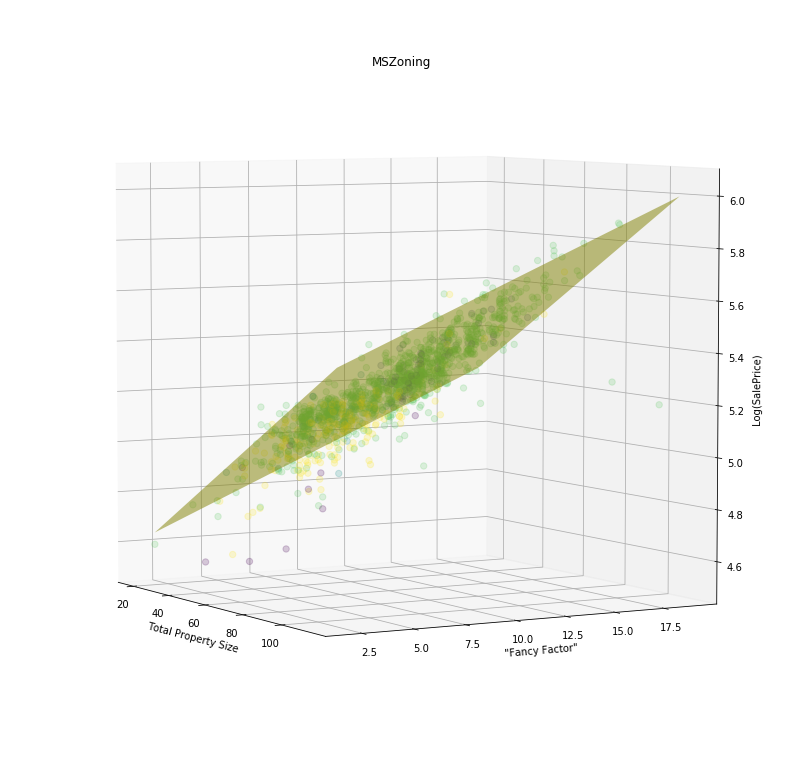

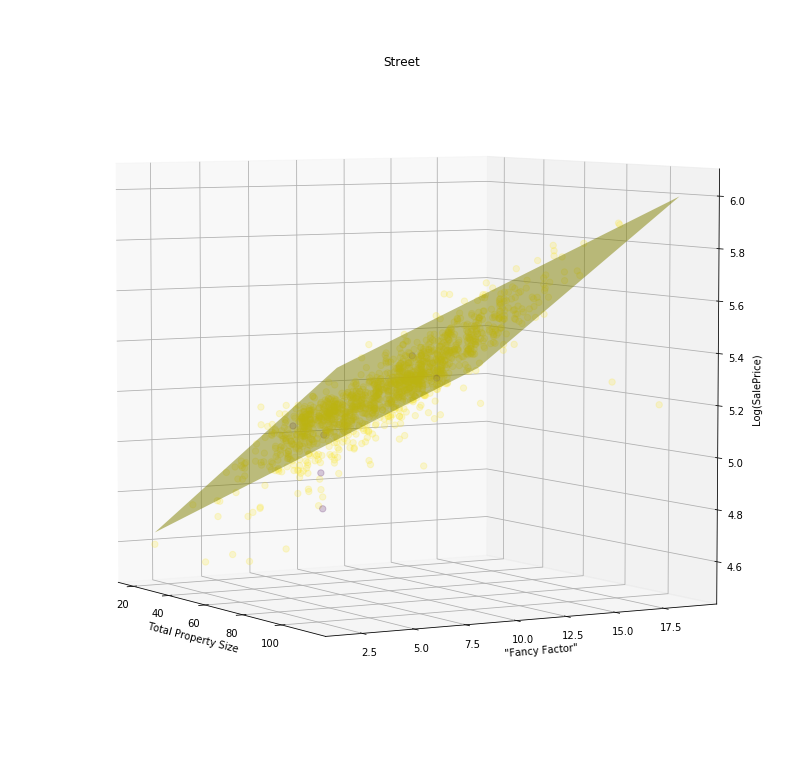

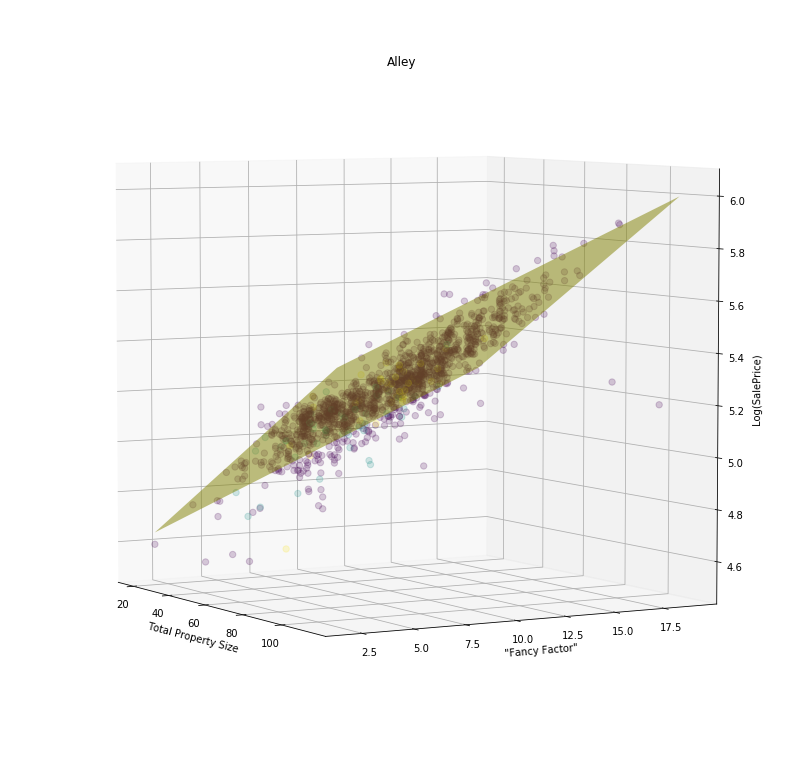

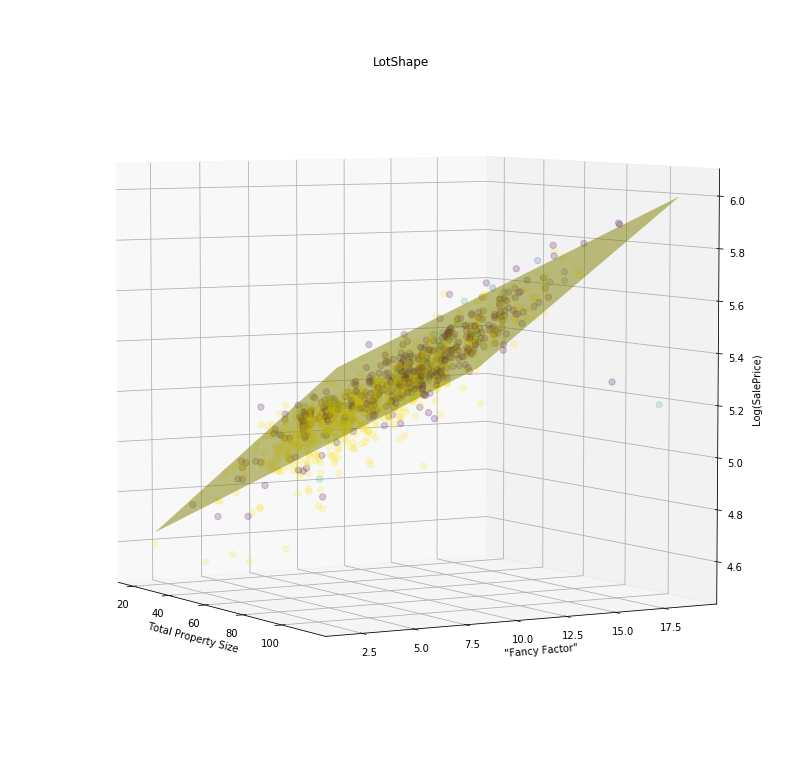

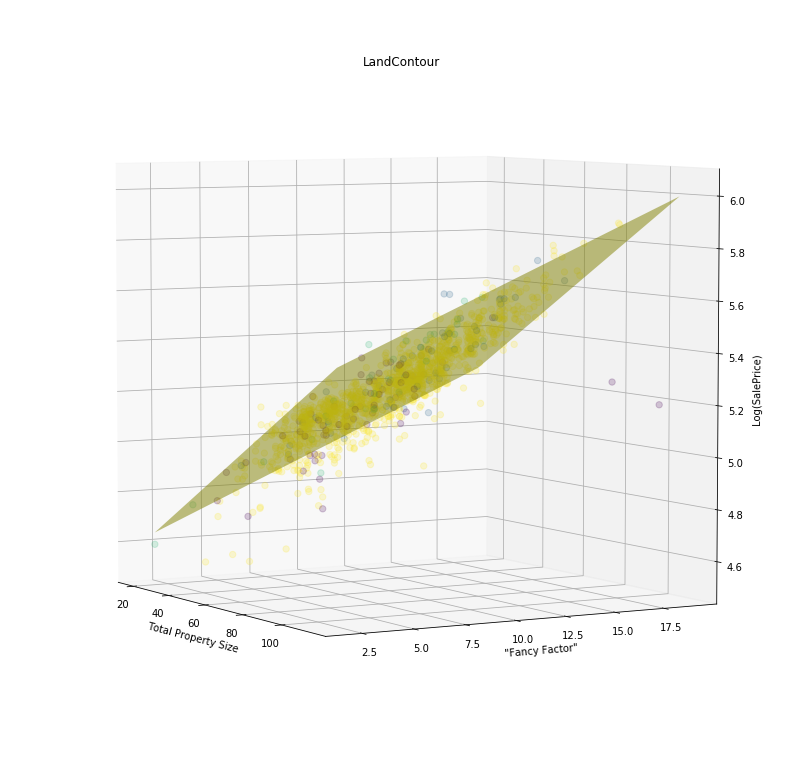

...

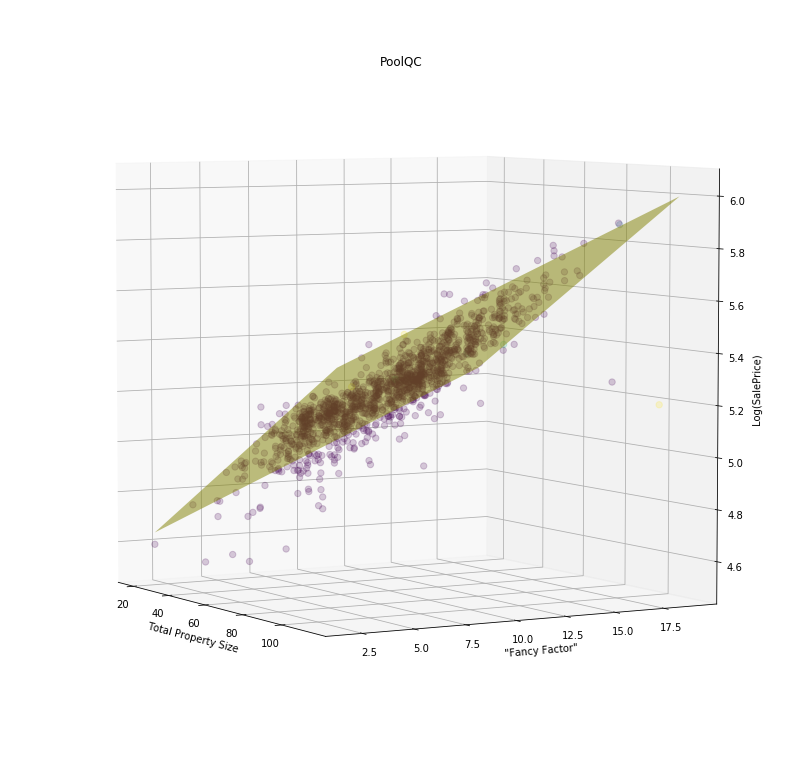

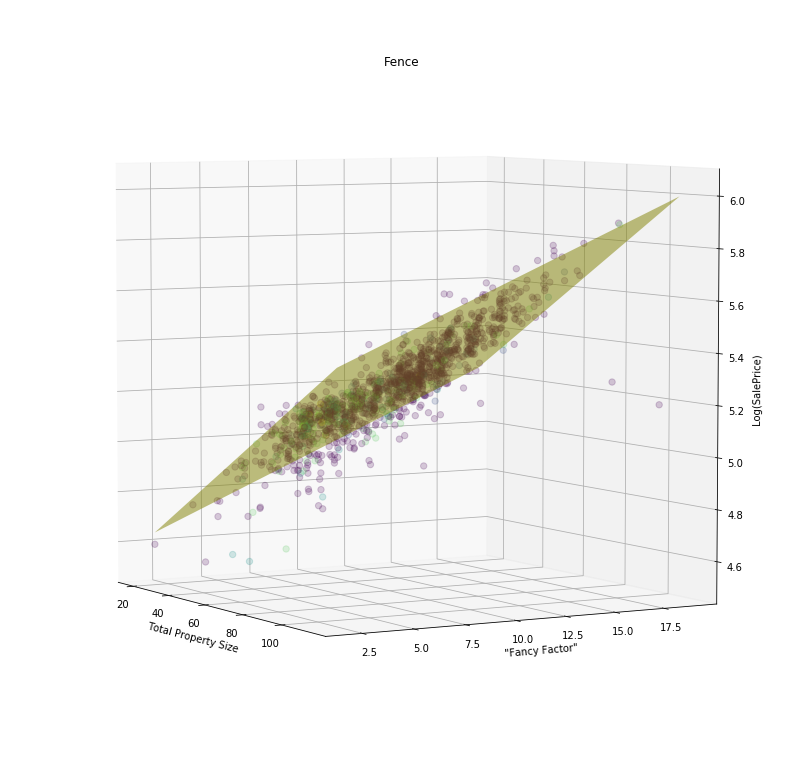

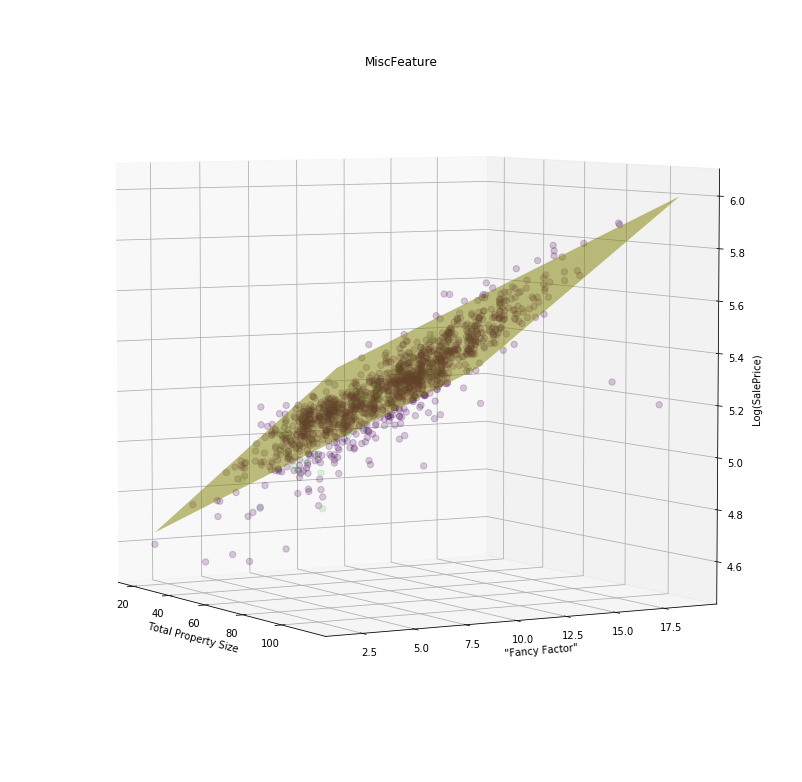

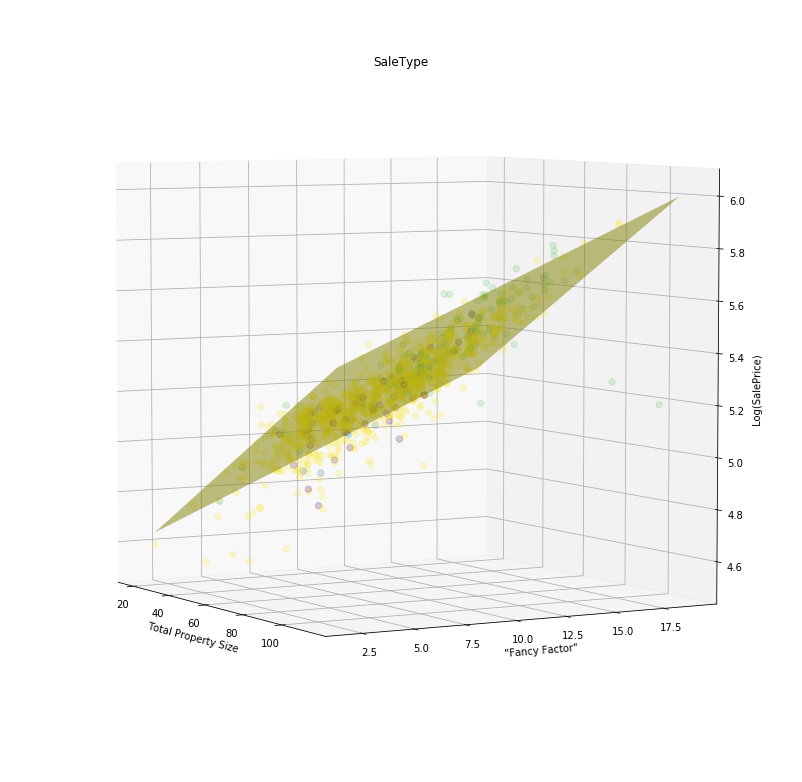

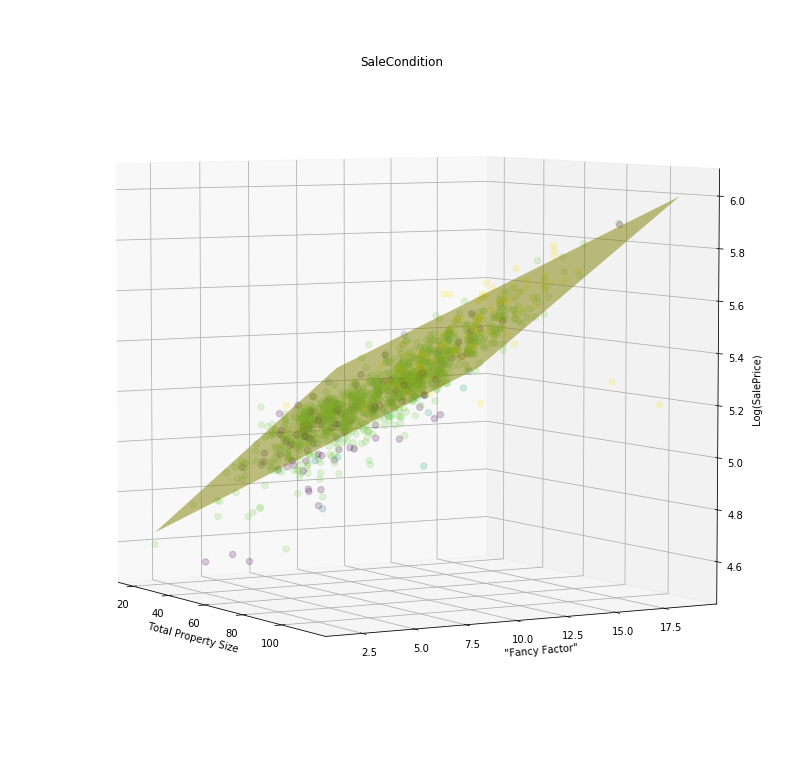

In [373]:
for each in CatNumNorm.columns:
    fig = plt.figure(figsize=(14, 14))
    ax = plt.axes(projection='3d')
    color = CatNumNorm[each]
# plot the data points
#X = np.array(list(map(lambda x: [1] + list(x), x_m)))  # Idiomatic Py3, but inefficient on Py2
#up = np.where(y_m >= np.sum(X*beta, axis=1))[0]
#down = np.where(y_m < np.sum(X*beta, axis=1))[0]
    ax.scatter(totalLF, fancy, target.SalePrice, c= color, alpha=.2, s = 40)
    ax.view_init(5, 330)
#15, 0 to see fancy
# 30, 180 to look down property size plane

# plot the plane which represents the true model
    x_1 = np.linspace(min(totalLF), max(totalLF.values), 25)
    x_2 = np.linspace(min(fancy), max(fancy), 25)
    x_1, x_2 = np.meshgrid(x_1, x_2)
    x_3 = betas[0]*x_1 + betas[1]*x_2 + intercept
    surface_kwargs = dict(rstride=100, cstride=100, color='yellow', alpha=0.5)
    ax.plot_surface(x_1, x_2, x_3, **surface_kwargs)
    ax.set_xlabel('Total Property Size')
    ax.set_ylabel('"Fancy Factor"')
    ax.set_zlabel('Log(SalePrice)')
    plt.title(each)

    plt.show()

In [312]:
# concenred the Categories that have a lot of nulls or do not contribute are diluting PCA results.
# probably don't, but cutting some features based on visual inspection and rerunning PCA
# turns out it's not necessary. results look about the same
#dfStr.isnull().sum()


MSZoning            0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinType2       38
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
KitchenQual         0
Functional          0
FireplaceQu       690
GarageType         81
GarageFinish       81
GarageQual         81
GarageCond         81
PavedDrive          0
PoolQC           1453
Fence            1179
MiscFeature      1406
SaleType            0
SaleCondition       0
dtype: int64

In [316]:
CutStr = dfStr.drop(['Alley', 'Street', 'Utilities', 'LandSlope', 'RoofMatl', 'PoolQC', 'Fence', 'MiscFeature'], axis = 1)

In [320]:
CutCatNum = NumericDataFrame(CutStr)()

In [321]:
CCatNumNorm=(CutCatNum-CutCatNum.min())/(CutCatNum.max()-CutCatNum.min())

In [328]:
#CCatNumNorm

In [324]:
pca.fit(CatNumNorm)
X2 = pca.transform(CatNumNorm)

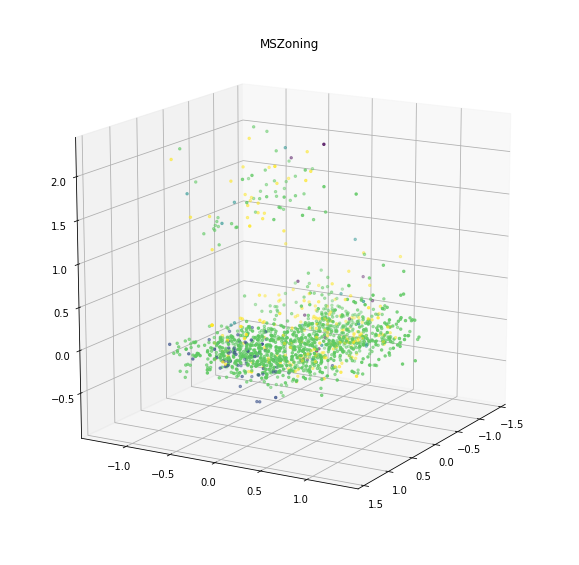

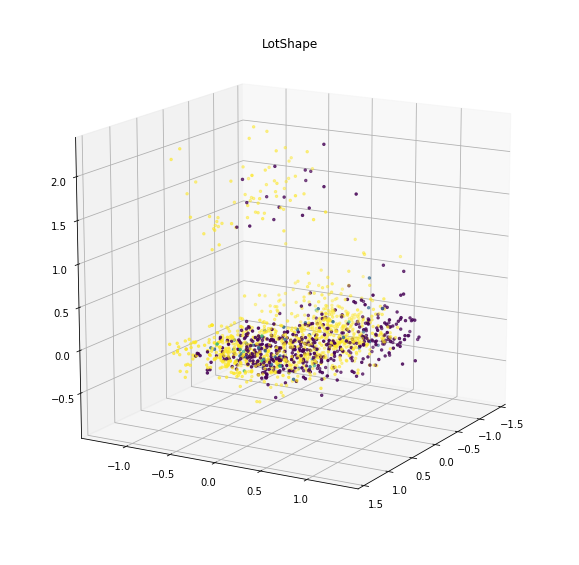

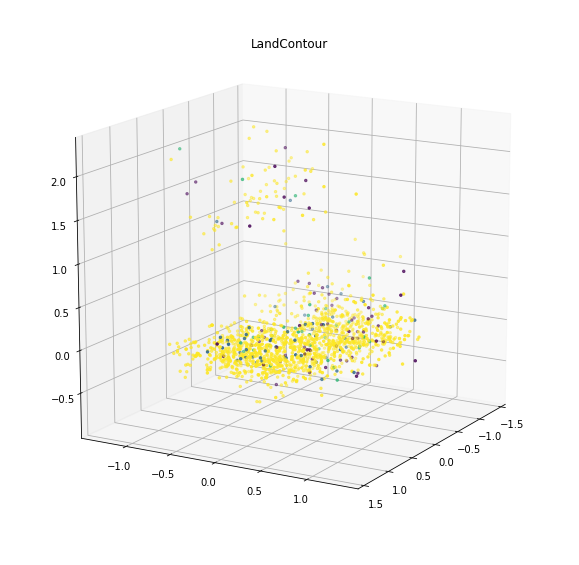

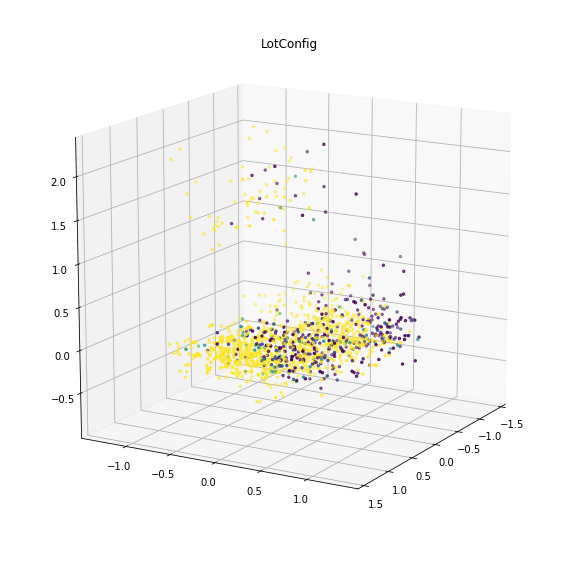

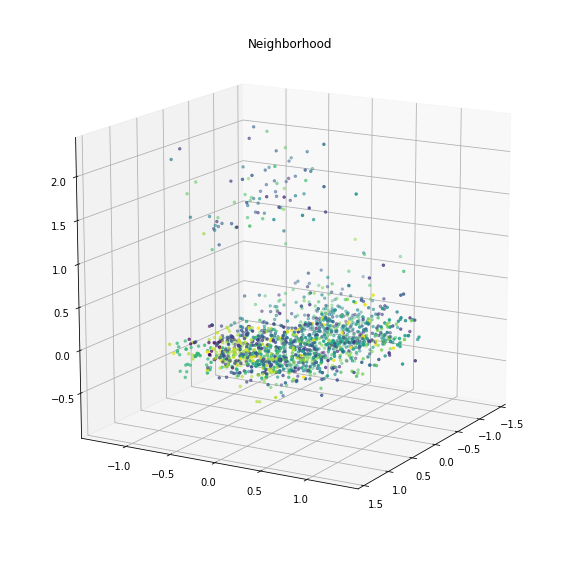

...

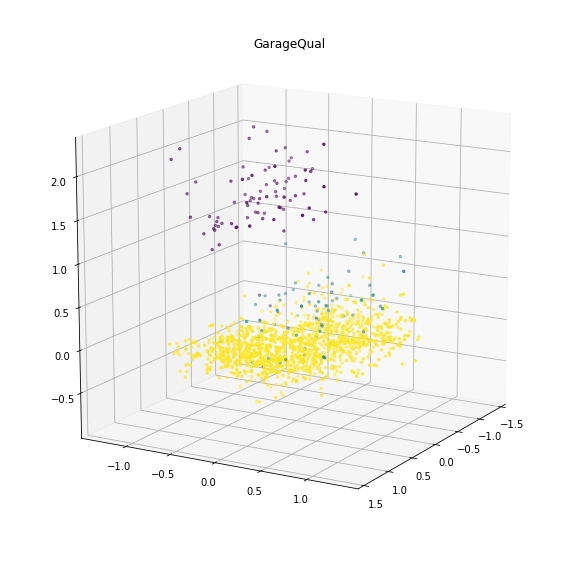

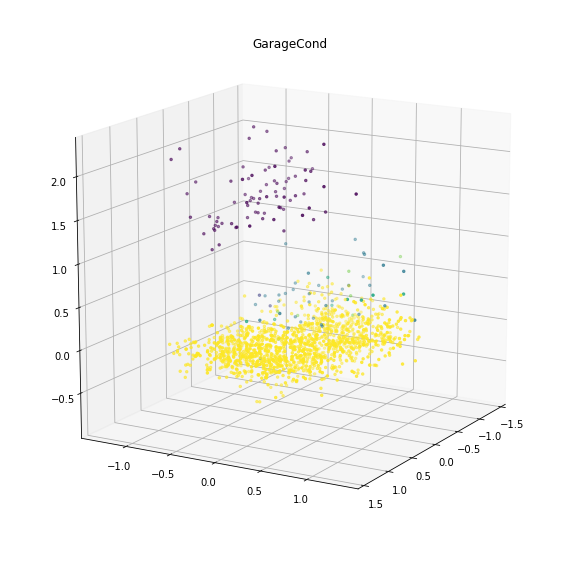

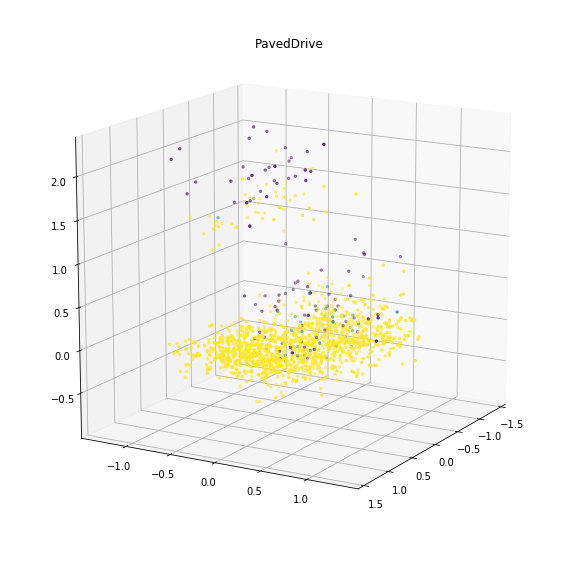

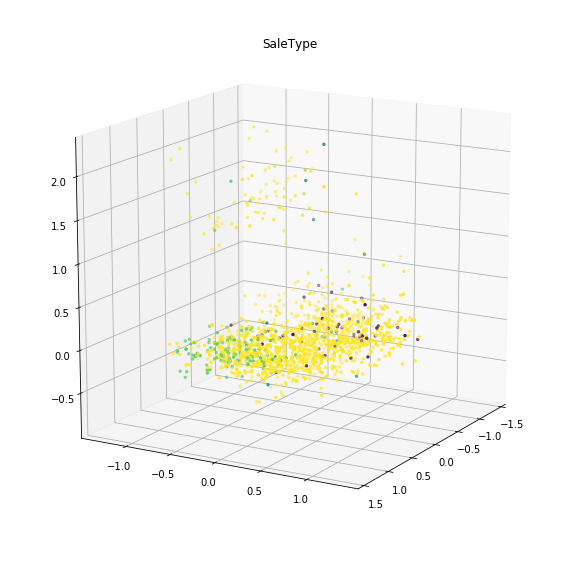

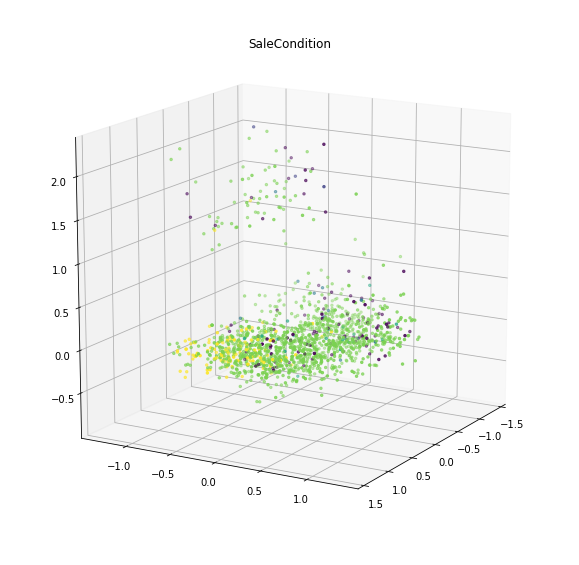

In [327]:
for each in CCatNumNorm.columns:
    fig = plt.figure(figsize = [10,10])
    color = CCatNumNorm[each]
    

    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(X2[:,0], X2[:,1], X2[:,2], c=color, s=6)
    plt.viridis()
    plt.title(each)

    ax.view_init(15, 30) # change these params to rotate cube
    plt.show()


# Attaching Clustering groups to dfInt and making lin model based on filtered groups

In [394]:
CutIntLF['group'] = labels
target['group'] = labels

In [395]:
G0 = CutIntLF[CutIntLF.group == 0][['totalLinFt', 'fanciness']]
G1 = CutIntLF[CutIntLF.group == 1][['totalLinFt', 'fanciness']]


In [396]:
y0 = target[target.group == 0][['SalePrice']]
y1 = target[target.group == 1][['SalePrice']]


In [397]:
lin.score(G1, y1) # it only improves 1 segment. let's take a look why

0.78239845750409653

In [403]:
lin = LinearRegression(fit_intercept = True, n_jobs = 10)

In [404]:
lin.fit(G0, y0).score(G0,y0)

0.60777290635728165

In [400]:
lin2 = LinearRegression(fit_intercept = False)

In [402]:
lin2.fit(G1, y1).score(G1, y1)

-15.493388879751972

# Review of work up until now. Next steps

all clustering methods off a 3d PCA of categorical values is generally making things worse

possible reasons: 

- reducing all categories to 3 dimensions is too much abstraction. Information loss? 
- we lost all the information we didn't use from dfInt 

next step:

try to attach all unused Continuous variables to categorical. feed to PCA 

Attaching unused dfInt to Categorical features and normalizing

In [421]:
dfInt.columns


Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object')

In [424]:
#drop all area and data used in TotalLF and fanciness
dfCatPlus = dfInt[['BedroomAbvGr', 'MSSubClass', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'BsmtFullBath', \
                 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'TotRmsAbvGrd', 'GarageYrBlt', 'MoSold', 'YrSold']]

In [428]:
dfCatPlusN = NumericDataFrame(dfCatPlus)() #impute

In [432]:
dfCatPlusNN = norm(dfCatPlusN) 

In [435]:
newCat = pd.concat([dfCatPlusN, CatNumNorm], axis = 1)

In [436]:
newCat.shape

(1460, 57)

In [453]:
# let's try to shove this all into 3 dimensions and see what happens 

pca.fit(dfCatPlusNN)
PCA = pca.transform(dfCatPlusNN)

pca.n_components

3

In [454]:
PCA

array([[-0.48554229,  0.1077731 ,  0.18766103],
       [ 0.15684296, -0.1695352 , -0.22739859],
       [-0.46040556, -0.02601185,  0.09029529],
       ..., 
       [-0.21819571,  0.55856977, -0.04355999],
       [ 0.01622305,  0.63328444, -0.32782278],
       [ 0.26604358,  0.06011685,  0.11306867]])

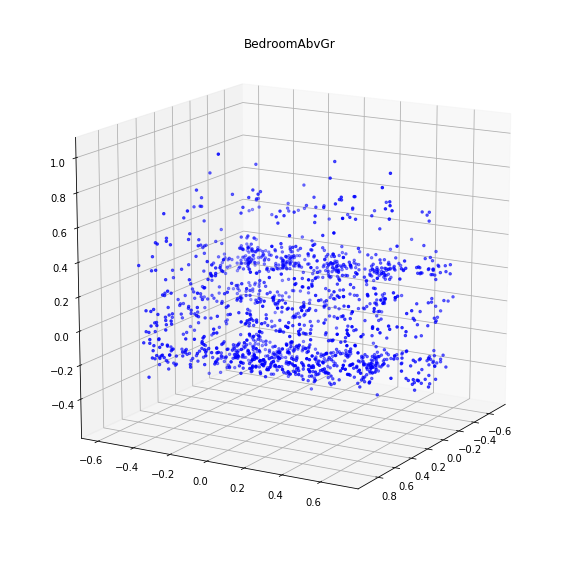

In [465]:
fig = plt.figure(figsize = [10,10])
    
    

ax = fig.add_subplot(111, projection='3d')
ax.scatter(PCA[:,0], PCA[:,1], PCA[:,2], c='b', s=6)

plt.title(each)

ax.view_init(15, 30) # change these params to rotate cube
plt.show()


array([ 0.25108344,  0.17834392,  0.11393052])

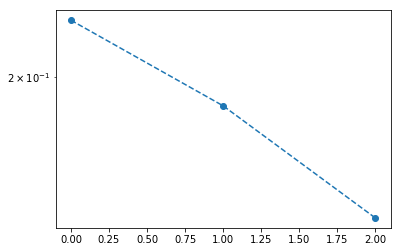

In [460]:
plt.semilogy(pca.explained_variance_ratio_, '--o')
pca.explained_variance_ratio_

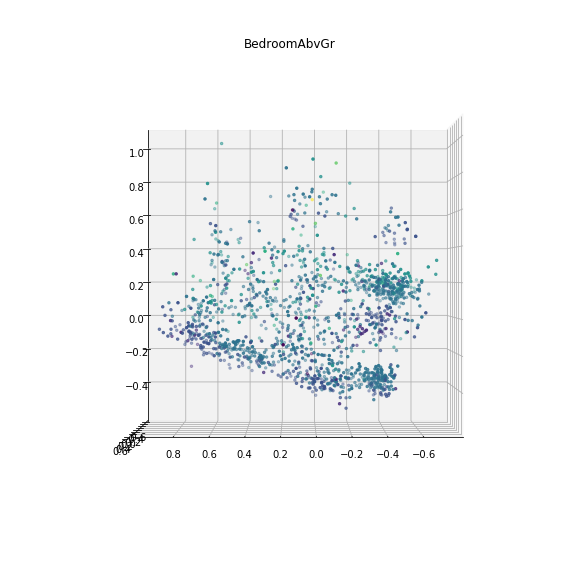

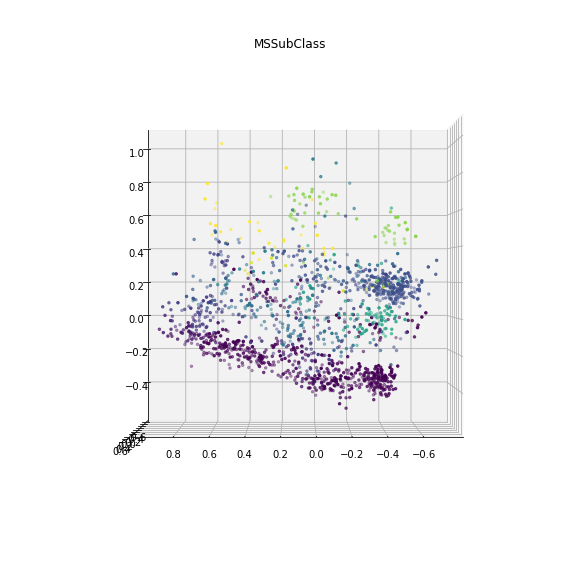

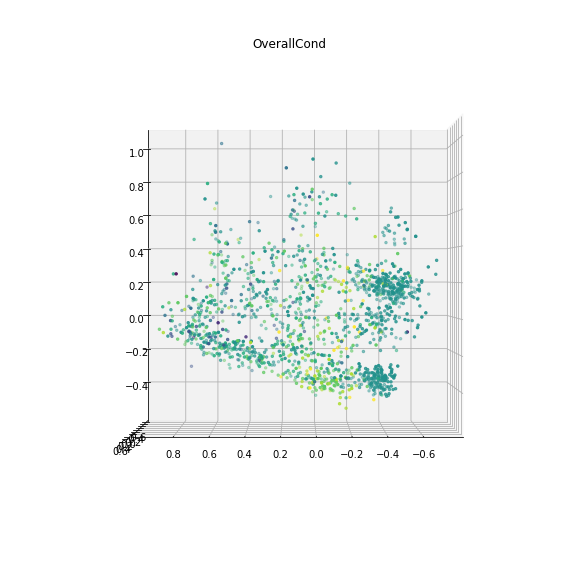

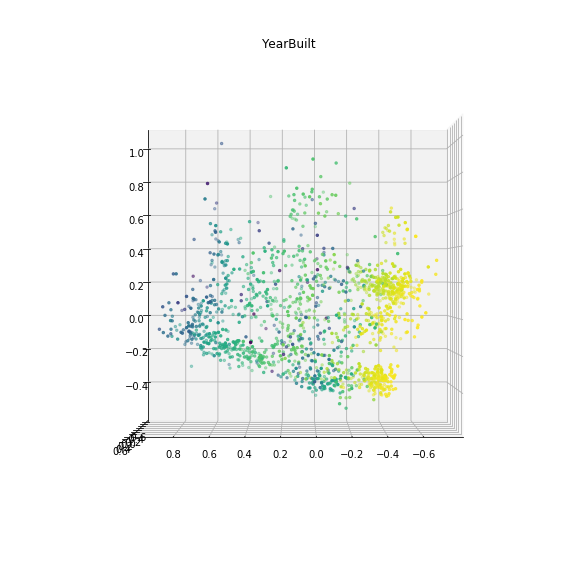

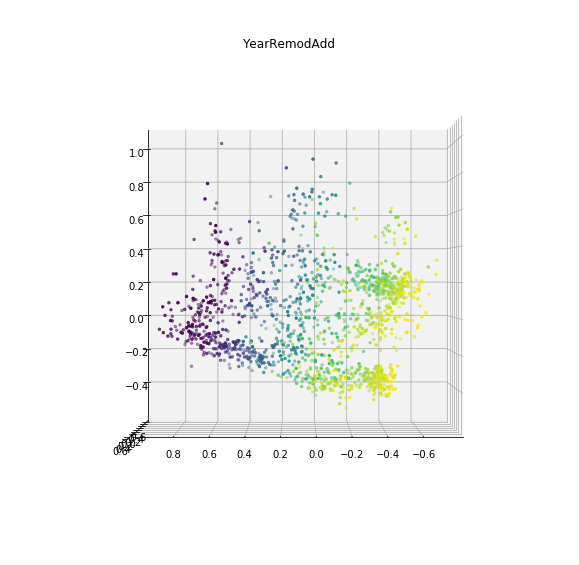

...

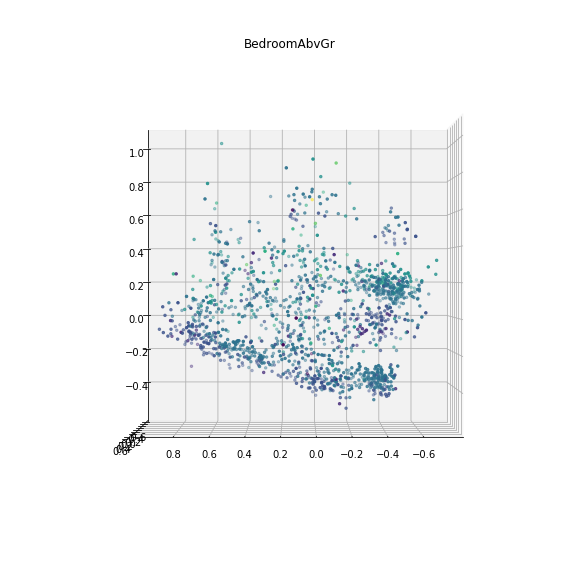

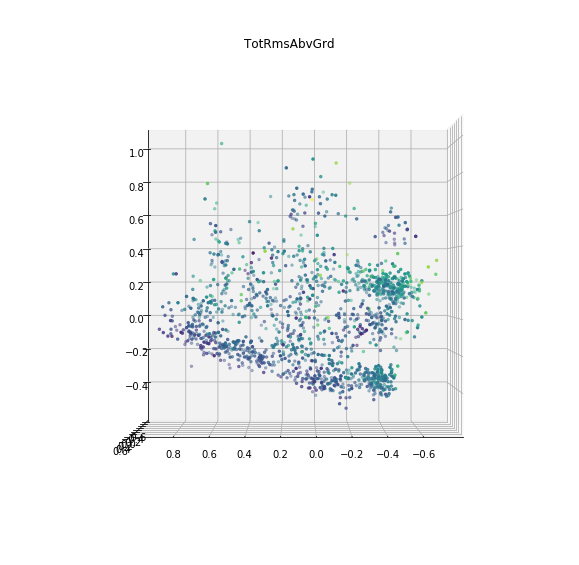

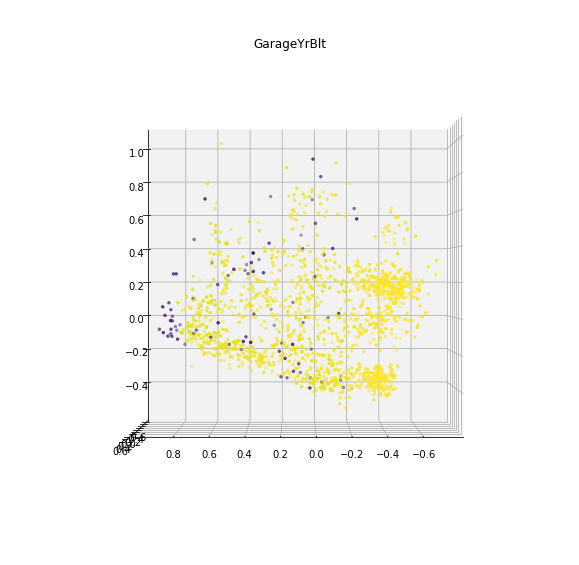

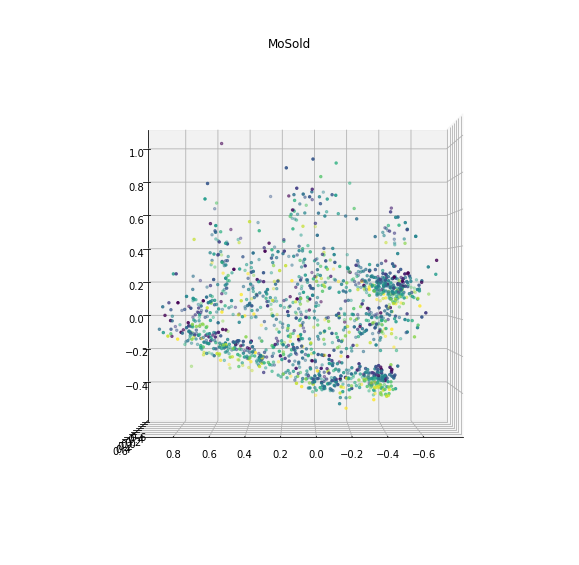

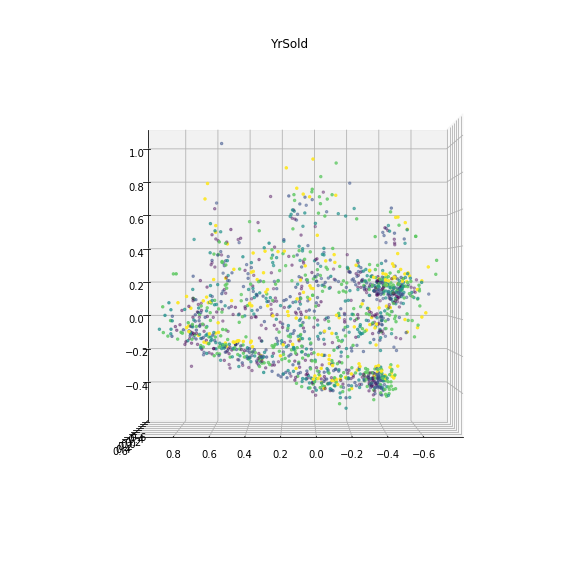

In [1069]:
for each in dfCatPlusNN.columns :
    fig = plt.figure(figsize = [10,10])
    color = dfCatPlusNN[[each]].iloc[:,0]
    

    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(PCA[:,0], PCA[:,1], PCA[:,2], c=color, s=6)
    plt.viridis()
    plt.title(each)

    ax.view_init(0, 90) # change these params to rotate cube
    plt.show()

In [495]:
dfCatPlusNN.columns

Index(['BedroomAbvGr', 'MSSubClass', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'TotRmsAbvGrd', 'GarageYrBlt', 'MoSold', 'YrSold'],
      dtype='object')

In [499]:
for each in dfCatPlusNN.columns :
    print(dfCatPlusNN[[each]].iloc[:,0].shape)

(1460,)
(1460,)
(1460,)
(1460,)
(1460,)
(1460,)
(1460,)
(1460,)
(1460,)
(1460,)
(1460,)
(1460,)
(1460,)
(1460,)


In [1471]:
from sklearn.neighbors import kneighbors_graph
connectivity = kneighbors_graph(PCA, n_neighbors=500, include_self=False)

AGroup = AgglomerativeClustering(n_clusters = 4, linkage = 'average', connectivity = connectivity)
AGroup.fit(PCA)
Clusters = AGroup.labels_

In [1472]:
kmeans = KMeans(n_clusters = 3)
kmeans.fit(PCA)
labels = kmeans.labels_


In [1473]:
from sklearn.cluster import DBSCAN 
db = DBSCAN(eps = .25, min_samples = 120)
db.fit(PCA)
dbs = db.labels_ + 1
dbs

array([1, 0, 1, ..., 0, 0, 0], dtype=int64)

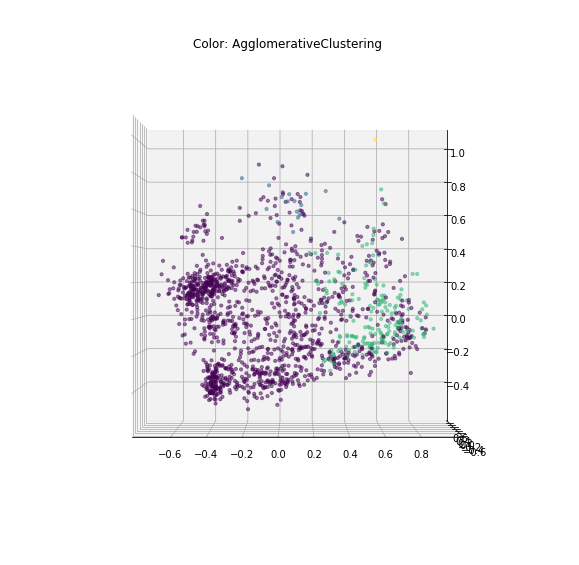

In [1474]:
fig = plt.figure(figsize = [10,10])
color = Clusters
    

ax = fig.add_subplot(111, projection='3d')
ax.scatter(PCA[:,0], PCA[:,1], PCA[:,2], c=color, s=10, alpha = 0.5)
plt.viridis()
plt.title("Color: AgglomerativeClustering ")


ax.view_init(0, -90) # change these params to rotate cube
plt.show()

In [1475]:
pca_2d = decomposition.PCA(n_components = 2)
pca_2d.fit(dfCatPlusNN)
PCA_2d = pca_2d.transform(dfCatPlusNN)

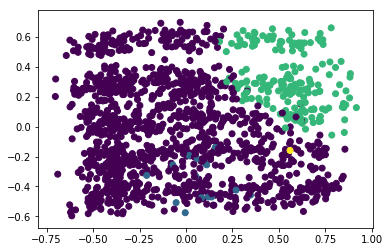

In [1476]:
color = Clusters
plt.scatter(PCA_2d[:,0], PCA_2d[:,1], c = color)


In [1477]:
CutIntLF['group'] = Clusters
target['group'] = Clusters

In [1478]:
G0 = CutIntLF[CutIntLF.group == 0][['totalLinFt', 'fanciness']]
G1 = CutIntLF[CutIntLF.group == 1][['totalLinFt', 'fanciness']]
G2 = CutIntLF[CutIntLF.group == 2][['totalLinFt', 'fanciness']]
G3 = CutIntLF[CutIntLF.group == 3][['totalLinFt', 'fanciness']]

In [1479]:
y0 = target[target.group == 0][['SalePrice']]
y1 = target[target.group == 1][['SalePrice']]
y2 = target[target.group == 2][['SalePrice']]
y3 = target[target.group == 3][['SalePrice']]

In [1481]:
lin = LinearRegression()
lin.fit(G1, y1)
lin.score(G1, y1)

# so far... top winner knn 20, 3 nodes, linkage = complete 
# so far ... Aglomerative Clustering w/ connectivity, n-nearest neighbors = 100, 3 clusters, 1 improved 2 are worse

0.73692782450523908